In [82]:
import cv2
import numpy as np
from utils import show_images

rgb_img = cv2.imread('./image/cow.jpg')
gauss = np.random.normal(0, 40, rgb_img.shape)
noisy_rgb_img = rgb_img + gauss
noisy_rgb_img = noisy_rgb_img.clip(0, 255).astype(np.uint8)

gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)
gauss = np.random.normal(0, 40, gray_img.shape)
noisy_gray_img = gray_img + gauss
noisy_gray_img = noisy_gray_img.clip(0, 255).astype(np.uint8)

# show_images([('src', rgb_img), ('noisy', noisy_rgb_img), ('noisy', noisy_gray_img)])

In [60]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def metrics(raw_img, new_img):
    x1 = raw_img[10:-10, 10:-10]
    x2 = new_img[10:-10, 10:-10]

    if x1.max() > 1: x1 = (x1.astype(np.uint8) / 255)
    if x2.max() > 1: x2 = (x2.astype(np.uint8) / 255)

    mse = np.mean((x1-x2) ** 2)
    return 1000 if mse==0 else 10*np.log(1/mse)


def draw_denoising(src_img, recover_imgs, titles, figsize=(24, 24)):
    # compute_psnr
    psnrs = np.round(np.array([metrics(src_img, x) for x in recover_imgs]), 2)

    rownum, colnum = 1, len(recover_imgs)

    _, axes = plt.subplots(rownum, colnum, figsize=figsize)
    axes = axes.reshape(rownum, colnum)

    for idx, img in enumerate(recover_imgs):
        axes[0, idx].set_axis_off()
        axes[0, idx].set_title(f'{titles[idx]}\npsnr = {psnrs[idx]}')

        if len(img.shape) > 2:
            axes[0, idx].imshow(img[..., ::-1])
        else:
            axes[0, idx].imshow(img, cmap="gray")

    max_idx = np.argmax(psnrs)
    axes[0, max_idx].set_axis_on()
    for spine in axes[0, max_idx].spines.values():
        spine.set_edgecolor('red')
        spine.set_linewidth(3)

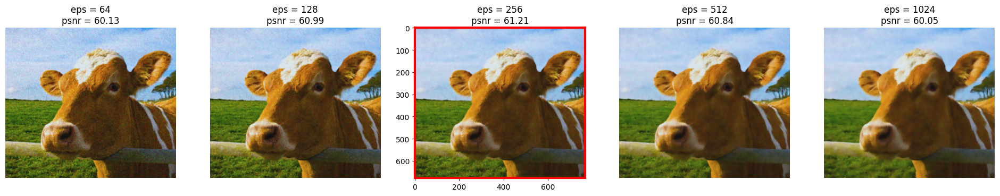

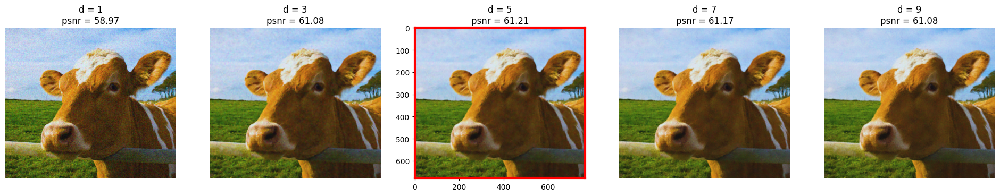

In [69]:
# guidedFilter
gauss_rgb_img = cv2.GaussianBlur(noisy_rgb_img, (7, 7), 0)
titles, result = [], []
for i in range(6, 11, 1):
    now_img = cv2.ximgproc.guidedFilter(gauss_rgb_img, noisy_rgb_img, radius=5, eps=pow(2, i))
    result.append(now_img)
    titles.append(f'eps = {pow(2, i)}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
for i in range(1, 10, 2):
    now_img = cv2.ximgproc.guidedFilter(gauss_rgb_img, noisy_rgb_img, radius=i, eps=pow(2, 8))
    result.append(now_img)
    titles.append(f'd = {i}')
draw_denoising(rgb_img, result, titles)


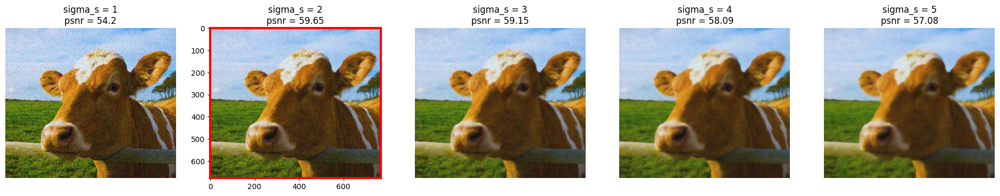

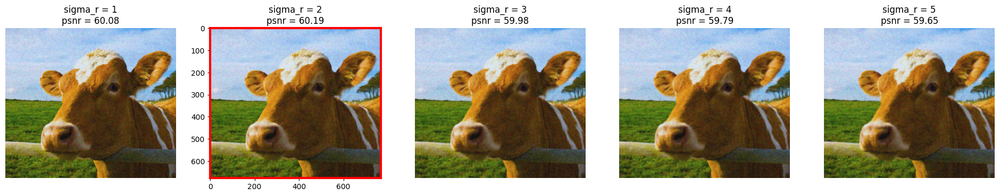

In [70]:
# amFilter
gauss_rgb_img = cv2.GaussianBlur(noisy_rgb_img, (7, 7), 0)
titles, result = [], []
for i in range(1, 6, 1):
    now_img = cv2.ximgproc.amFilter(gauss_rgb_img, noisy_rgb_img, sigma_s=i, sigma_r=0.5, adjust_outliers=False)
    result.append(now_img)
    titles.append(f'sigma_s = {i}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
for i in range(1, 6, 1):
    now_img = cv2.ximgproc.amFilter(gauss_rgb_img, noisy_rgb_img, sigma_s=2, sigma_r=i/10, adjust_outliers=False)
    result.append(now_img)
    titles.append(f'sigma_r = {i}')
draw_denoising(rgb_img, result, titles)

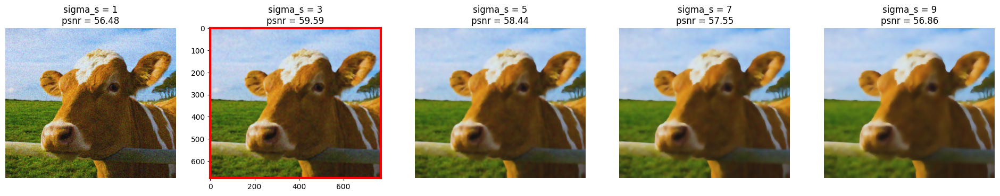

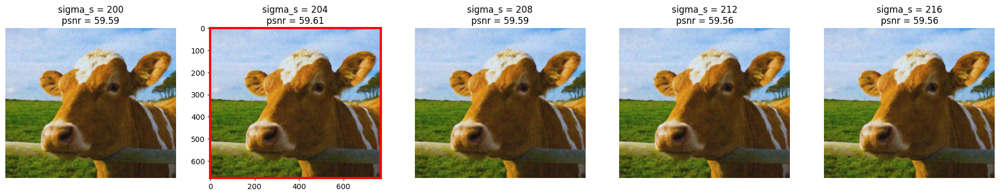

In [74]:
# dtFilter
gauss_rgb_img = cv2.GaussianBlur(noisy_rgb_img, (7, 7), 0)
titles, result = [], []
for i in range(1, 11, 2):
    now_img = cv2.ximgproc.dtFilter(gauss_rgb_img, noisy_rgb_img, sigmaSpatial=i, sigmaColor=200, mode=cv2.ximgproc.DTF_NC, numIters=3)
    result.append(now_img)
    titles.append(f'sigma_s = {i}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
for i in range(200, 220, 4):
    now_img = cv2.ximgproc.dtFilter(gauss_rgb_img, noisy_rgb_img, sigmaSpatial=3, sigmaColor=i, mode=cv2.ximgproc.DTF_NC, numIters=3)
    result.append(now_img)
    titles.append(f'sigma_s = {i}')
draw_denoising(rgb_img, result, titles)


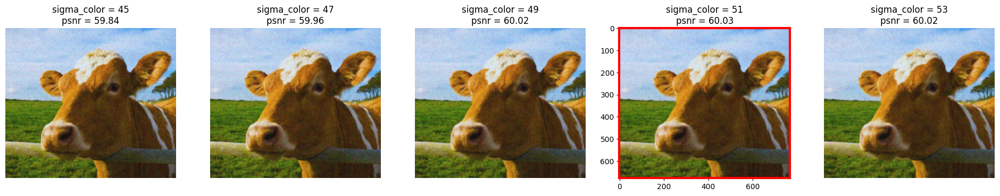

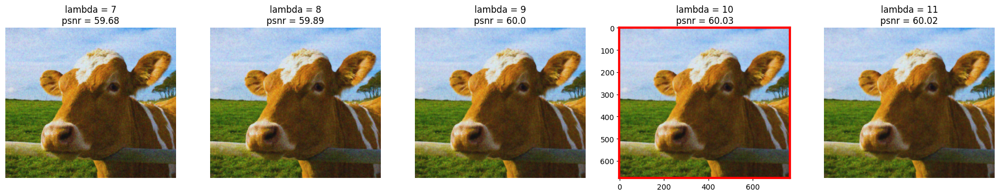

In [75]:
# fastGlobalSmootherFilter
# lambda_attenuation	internal parameter, defining how much lambda decreases after each iteration. Normally, it should be 0.25. Setting it to 1.0 may lead to streaking artifacts.
# num_iter	            number of iterations used for filtering, 3 is usually enough.
gauss_rgb_img = cv2.GaussianBlur(noisy_rgb_img, (7, 7), 0)
titles, result = [], []
for i in range(45, 55, 2):
    now_img = cv2.ximgproc.fastGlobalSmootherFilter(noisy_rgb_img, noisy_rgb_img, lambda_=10, sigma_color=i, lambda_attenuation=0.25, num_iter=3)
    result.append(now_img)
    titles.append(f'sigma_color = {i}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
for i in range(7, 12, 1):
    now_img = cv2.ximgproc.fastGlobalSmootherFilter(noisy_rgb_img, noisy_rgb_img, lambda_=i, sigma_color=50, lambda_attenuation=0.25, num_iter=3)
    result.append(now_img)
    titles.append(f'lambda = {i}')
draw_denoising(rgb_img, result, titles)


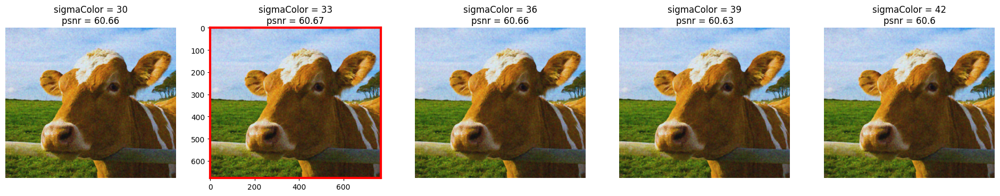

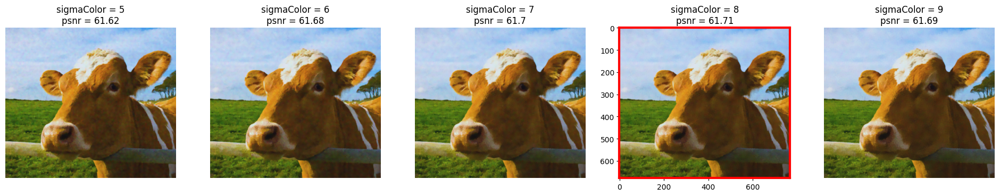

In [81]:
# jointBilateralFilter
gauss_rgb_img = cv2.GaussianBlur(noisy_rgb_img, (7, 7), 0)
titles, result = [], []
for i in range(30, 45, 3):
    now_img = cv2.ximgproc.jointBilateralFilter(gauss_rgb_img, noisy_rgb_img, d=-1, sigmaColor=i, sigmaSpace=3)
    result.append(now_img)
    titles.append(f'sigmaColor = {i}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
for i in range(5, 10, 1):
    now_img = cv2.ximgproc.jointBilateralFilter(gauss_rgb_img, noisy_rgb_img, d=-1, sigmaColor=30, sigmaSpace=i)
    result.append(now_img)
    titles.append(f'sigmaColor = {i}')
draw_denoising(rgb_img, result, titles)


In [ ]:
# rollingGuidanceFilter
titles, result = [], []
for i in range(50, 100, 10):
    now_img = cv2.ximgproc.rollingGuidanceFilter(noisy_rgb_img, d=-1, sigmaColor=i, sigmaSpace=3, numOfIter=3, borderType=cv2.BORDER_DEFAULT)
    result.append(now_img)
    titles.append(f'sigmaColor = {i}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
for i in range(1, 6, 1):
    # d 和 sigmaSpace 的关系和双边滤波一样，d 的优先级大于 sigmaSpace，d 小于 0 才看 sigmaSpace
    now_img = cv2.ximgproc.rollingGuidanceFilter(noisy_rgb_img, d=-1, sigmaColor=70, sigmaSpace=i, numOfIter=3, borderType=cv2.BORDER_DEFAULT)
    result.append(now_img)
    titles.append(f'sigmaSpace = {i}')
draw_denoising(rgb_img, result, titles)